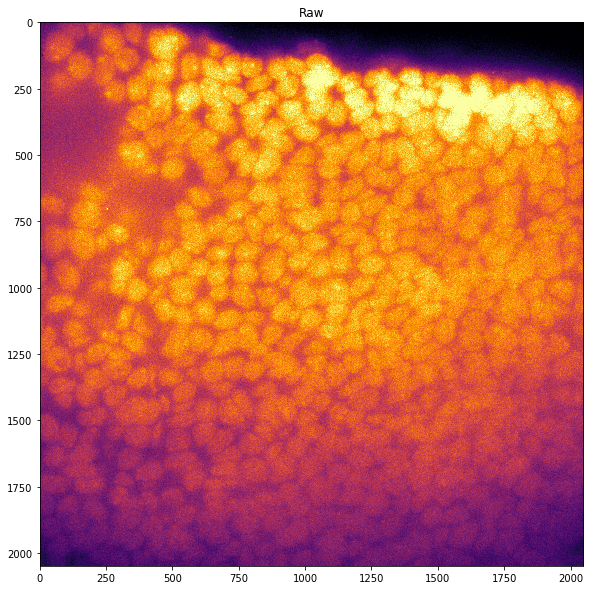

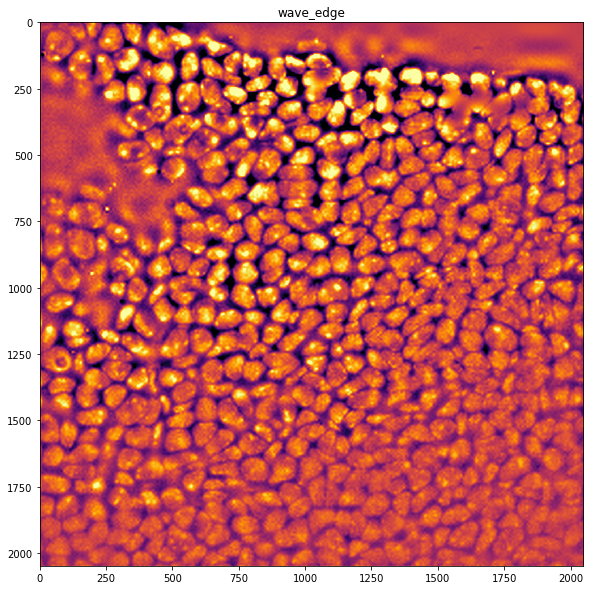

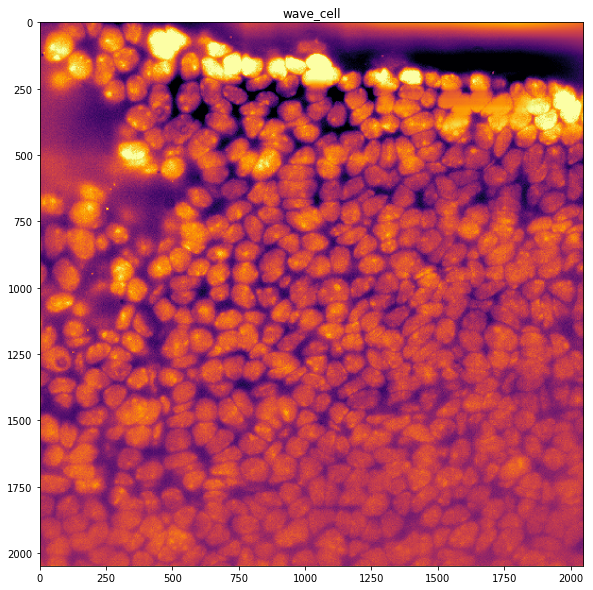

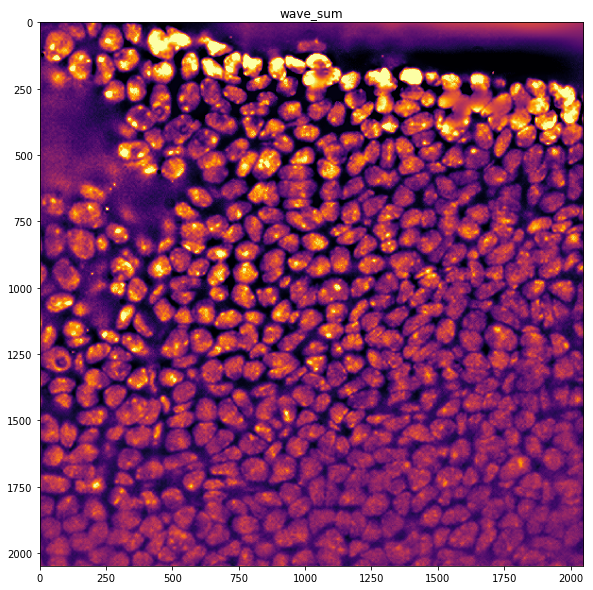

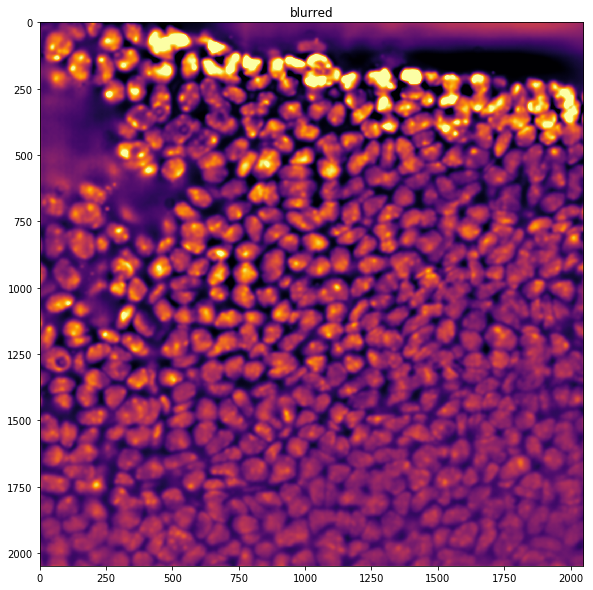

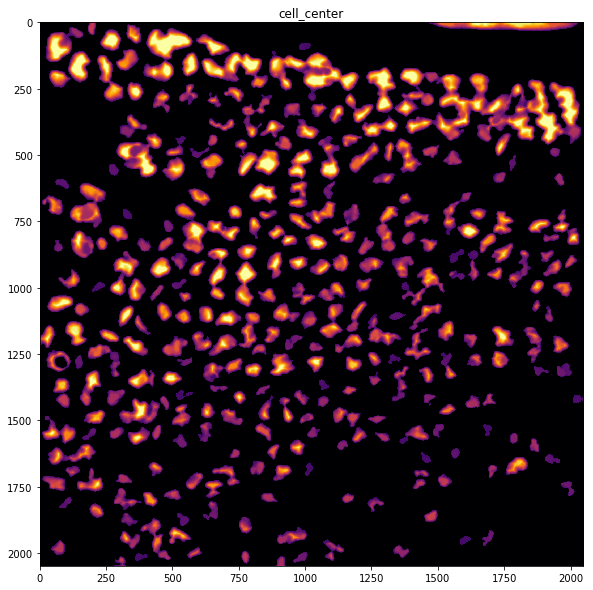

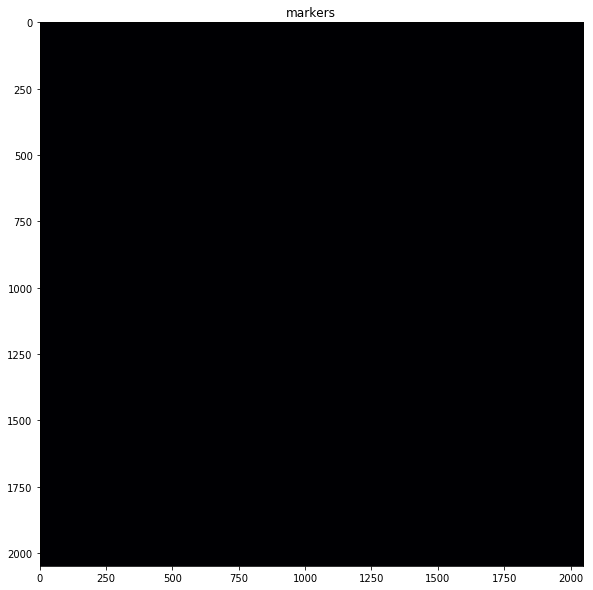

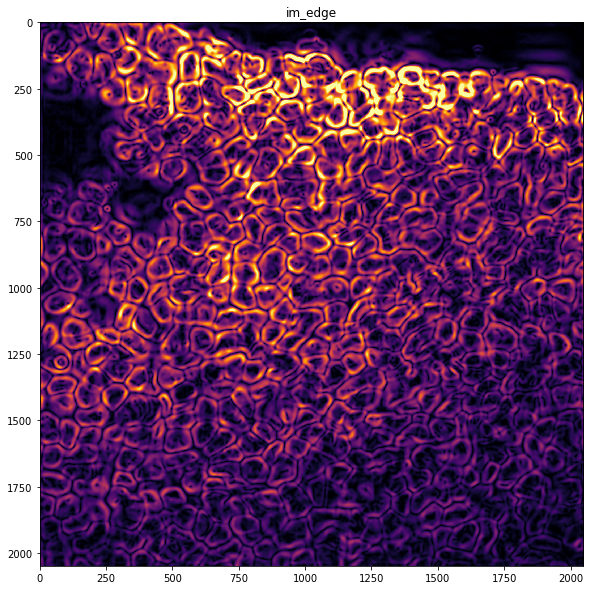

FileNotFoundError: [Errno 2] No such file or directory: '/hybedata/Images/Zach/ExVivo/15Hr_2019May10/results/segmentation_Pos1/watershed.tiff'

In [9]:
import pywt
import numpy as np
import datetime
from segmentation_3D import *
from skimage.external import tifffile
import matplotlib.pyplot as plt
%matplotlib inline
start = datetime.datetime.now()
"""Load Images"""
from metadata import Metadata
import matplotlib.pyplot as plt
import pickle

pos = 'Pos1'
display_z = 20
base_path = os.path.join(md_path,'results','segmentation_'+pos)
if not os.path.exists(base_path):
    os.makedirs(base_path)

fname = os.path.join(base_path,'Raw.tiff')
nucstk = np.swapaxes(np.swapaxes(tifffile.imread(fname),1,2),0,2)
Display(nucstk[:,:,display_z],title='Raw')
fname = os.path.join(base_path,'wave_edge.tiff')
wave_edge = np.swapaxes(tifffile.imread(fname),0,2)
Display(wave_edge[:,:,display_z],title='wave_edge')
fname = os.path.join(base_path,'wave_cell.tiff')
wave_cell = np.swapaxes(tifffile.imread(fname),0,2)
Display(wave_cell[:,:,display_z],title='wave_cell')
fname = os.path.join(base_path,'wave_sum.tiff')
wave_sum = np.swapaxes(tifffile.imread(fname),0,2)
Display(wave_sum[:,:,display_z],title='wave_sum')
fname = os.path.join(base_path,'blurred.tiff')
blurred = np.swapaxes(tifffile.imread(fname),0,2)
Display(blurred[:,:,display_z],title='blurred')
fname = os.path.join(base_path,'cell_center.tiff')
cell_center = np.swapaxes(tifffile.imread(fname),0,2)
Display(cell_center[:,:,display_z],title='cell_center')
fname = os.path.join(base_path,'markers.tiff')
markers = np.swapaxes(tifffile.imread(fname),0,2)
Display(markers[:,:,display_z],title='markers')
fname = os.path.join(base_path,'im_edge.tiff')
im_edge = np.swapaxes(tifffile.imread(fname),0,2)
Display(im_edge[:,:,display_z],title='im_edge')
fname = os.path.join(base_path,'watershed.tiff')
watershed = np.swapaxes(tifffile.imread(fname),0,2)
Display(watershed[:,:,display_z],title='watershed')

In [1]:
from metadata import Metadata
import matplotlib.pyplot as plt
from fish_helpers import *
import numpy as np
import pandas as pd
from segmentation_3D import *

In [2]:
md_path = '/hybedata/Images/Zach/ExVivo/15Hr_2019May10/'
md = Metadata(md_path)

opening img_Pos1_000000066_000000000_DeepBlue_000_066.tif

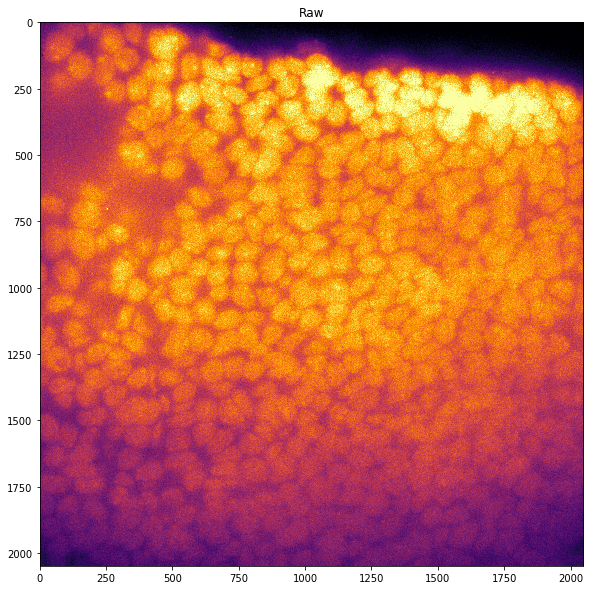

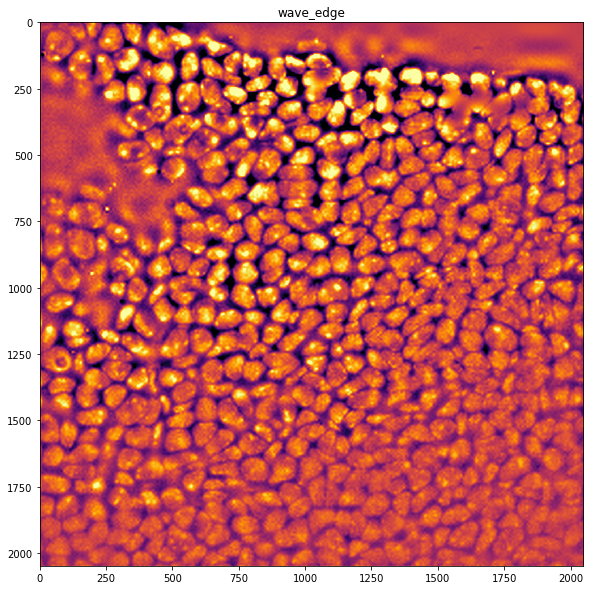

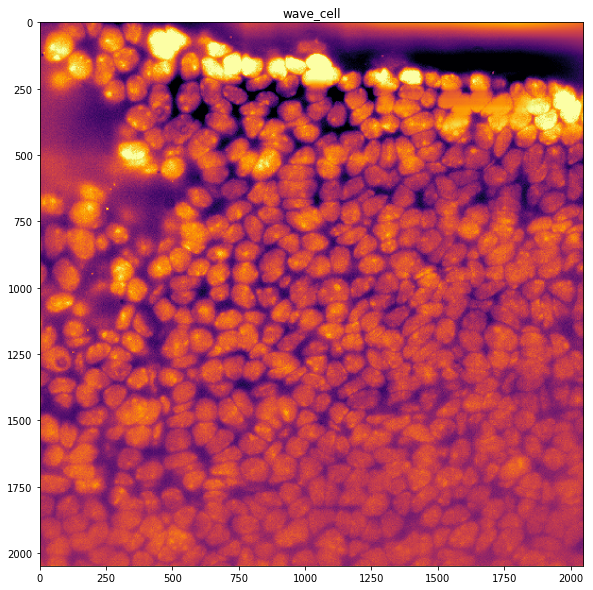

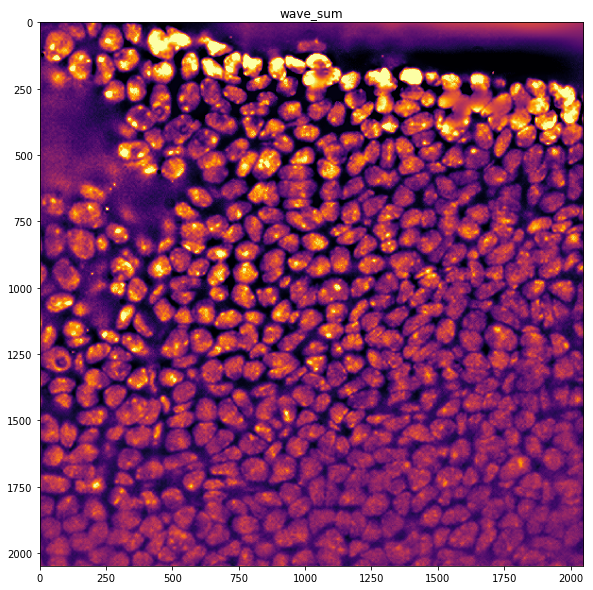

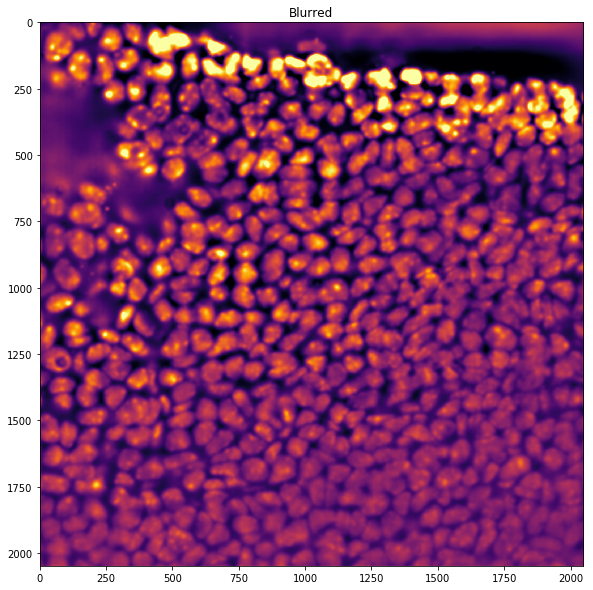

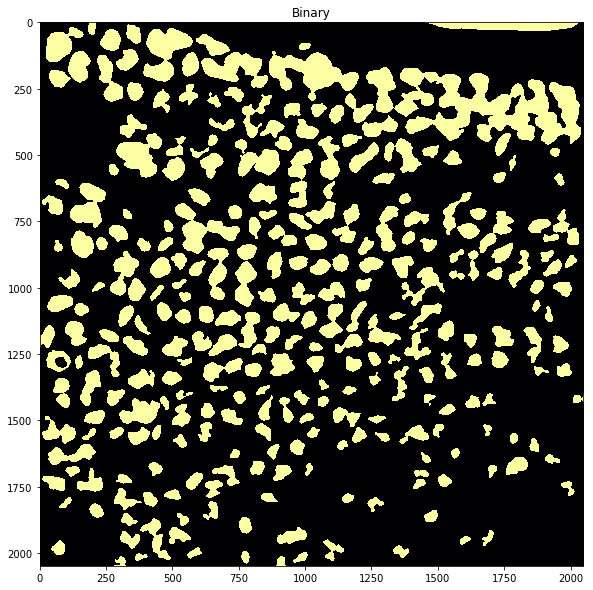

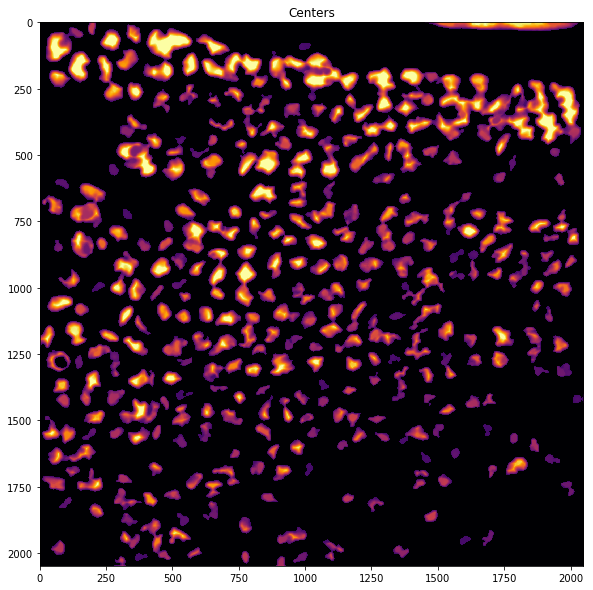

/home/zach/PythonRepos/PyImages/segmentation_3D.py:268: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  colors[:, 1] = 0  # remove green


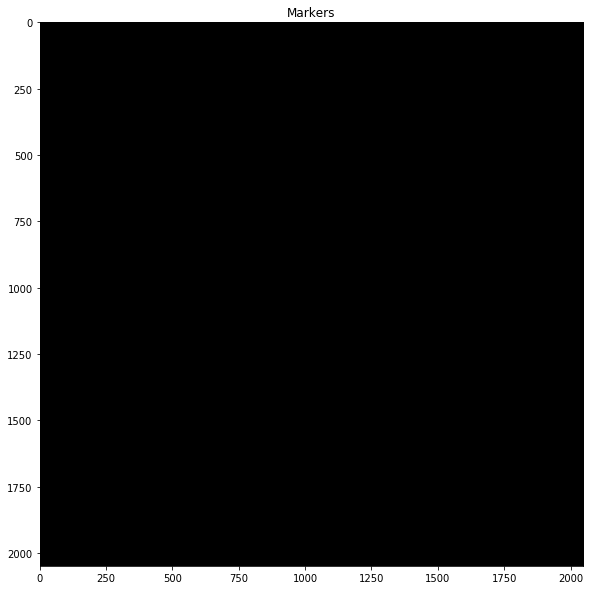

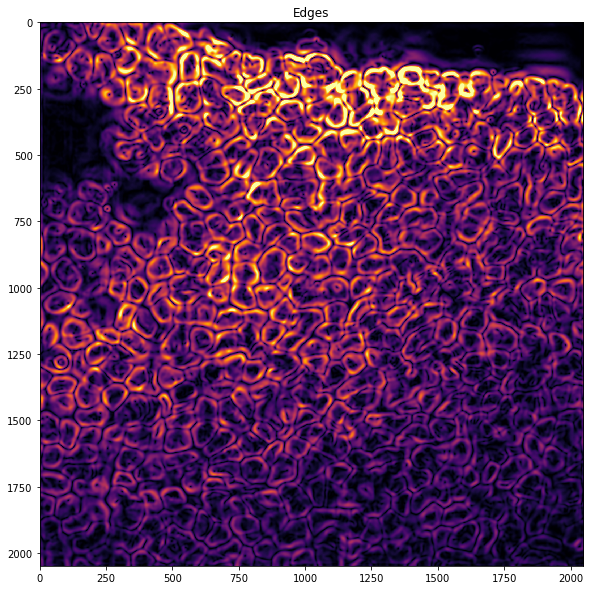

In [ ]:
import pywt
import numpy as np
import datetime
from segmentation_3D import *
from skimage.external import tifffile
import matplotlib.pyplot as plt
%matplotlib inline
start = datetime.datetime.now()
"""Load Images"""
from metadata import Metadata
import matplotlib.pyplot as plt
import pickle
pos = 'Pos1'
display_z = 20
nucstain = [i for i in md.acqnames if 'nucstain' in i]
nucstk = md.stkread(Position=pos,Channel='DeepBlue',acq=nucstain)
base_path = os.path.join(md_path,'results','segmentation_'+pos)
if not os.path.exists(base_path):
    os.makedirs(base_path)
fname = os.path.join(base_path,'Raw.tiff')
tifffile.imsave(fname, np.swapaxes(np.swapaxes(nucstk,0,2),1,2), metadata={'axes': 'ZYX'})
Display(nucstk[:,:,display_z],title='Raw')

params = {
        'clip_limit' : 0.17, # 0-1
        'background_blur' : 180, #block size I think?
        'image_blur' : 4.0, #gaussian kernal
        'threshold' : 75, #0-100
        'smallest_object' : 900, #pixels
        'dist_intensity_ratio' : 0.75, #0-1 weight
        'separation_distance' : 40, #pixels
        'edge_filter_blur' : 2.0, #kernel width in pixels
        'watershed_ratio' : 0.75, #0-1 ratio of distance from edge vs bwgeodesic
        'remove_image_edges': 1, # If true set all edges to 0
        'wavelet': 'db9', # wavelet to use
        'keep_list': [4,5,6], # wavelets to keep
                 }

wave_edge = wavelettransform(nucstk,'db9',keep_list=[4,5,6])
fname = os.path.join(base_path,'wave_edge.tiff')
tifffile.imsave(fname, np.swapaxes(wave_edge,0,2), metadata={'axes': 'ZYX'})
Display(wave_edge[:,:,display_z],title='wave_edge')

wave_cell = wavelettransform(nucstk,'db3',keep_list=[3,4,5,6,7,8])
fname = os.path.join(base_path,'wave_cell.tiff')
tifffile.imsave(fname, np.swapaxes(wave_cell,0,2), metadata={'axes': 'ZYX'})
Display(wave_cell[:,:,display_z],title='wave_cell')

wave_sum = wave_edge * wave_cell
fname = os.path.join(base_path,'wave_sum.tiff')
tifffile.imsave(fname, np.swapaxes(wave_sum,0,2), metadata={'axes': 'ZYX'})
Display(wave_sum[:,:,display_z],title='wave_sum')

blurred = blur(wave_sum, 4)
fname = os.path.join(base_path,'blurred.tiff')
tifffile.imsave(fname, np.swapaxes(blurred,0,2), metadata={'axes': 'ZYX'})
Display(blurred[:,:,display_z],title='Blurred')

im_bin = binarize(blurred,75,900)
Display(im_bin[:,:,display_z],title='Binary')

[cell_center, d_mat] = cell_centers(blurred, im_bin, 0.75)
fname = os.path.join(base_path,'cell_center.tiff')
tifffile.imsave(fname, np.swapaxes(cell_center,0,2), metadata={'axes': 'ZYX'})
fname = os.path.join(base_path,'d_mat.tiff')
tifffile.imsave(fname, np.swapaxes(d_mat,0,2), metadata={'axes': 'ZYX'})
Display(cell_center[:,:,display_z],title='Centers')

markers = fg_markers(cell_center, im_bin, 40, 1)
fname = os.path.join(base_path,'markers.tiff')
tifffile.imsave(fname, np.swapaxes(markers,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(markers[:,:,display_z], 'bg')
Display(out,title='Markers')

im_edge = sobel_edges(wave_edge, 6)
fname = os.path.join(base_path,'im_edge.tiff')
tifffile.imsave(fname, np.swapaxes(im_edge,0,2), metadata={'axes': 'ZYX'})
Display(im_edge[:,:,display_z],title='Edges')

watershed = watershed(markers, im_bin, im_edge, d_mat, 0.75, 1)
fname = os.path.join(base_path,'watershed.tiff')
tifffile.imsave(fname, np.swapaxes(watershed,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(watershed[:,:,display_z], 'bg')
Display(out,title='Watershed')

end = datetime.datetime.now()
print('started at',start)
print('ended at',end)

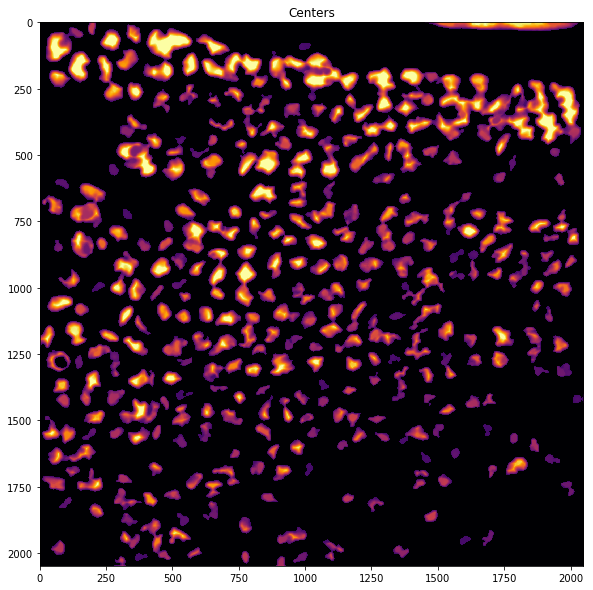

/home/zach/PythonRepos/PyImages/segmentation_3D.py:275: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



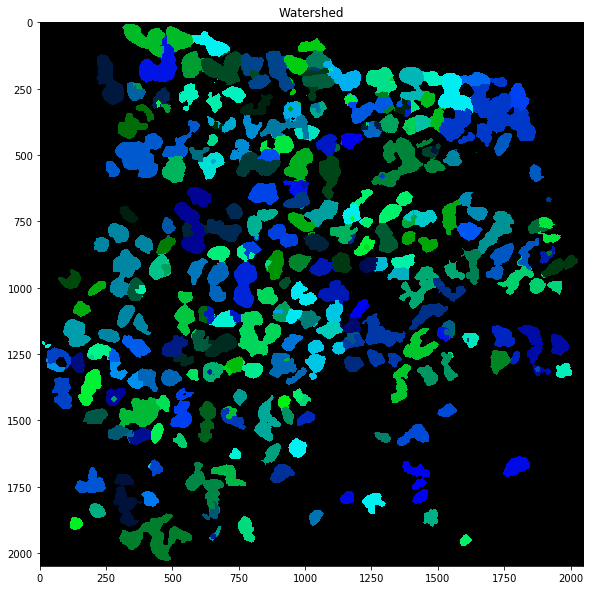

In [83]:
[cell_center, d_mat] = cell_centers(blurred, im_bin, 0.75)
fname = os.path.join(base_path,'cell_center.tiff')
tifffile.imsave(fname, np.swapaxes(cell_center,0,2), metadata={'axes': 'ZYX'})
fname = os.path.join(base_path,'d_mat.tiff')
tifffile.imsave(fname, np.swapaxes(d_mat,0,2), metadata={'axes': 'ZYX'})
Display(cell_center[:,:,display_z],title='Centers')

watershed = watershed(markers, im_bin, im_edge, d_mat, 0.75, 1)
fname = os.path.join(base_path,'watershed.tiff')
tifffile.imsave(fname, np.swapaxes(watershed,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(watershed[:,:,display_z], 'bg')
Display(out,title='Watershed')

In [ ]:
peaks = peak_local_max(im_cent, min_distance=int(val), labels=im_bin, exclude_border=int(edges))


In [87]:
peaks = peak_local_max(im_cent, min_distance=int(val), labels=im_bin, exclude_border=int(edges))
from scipy.spatial import Voronoi
segmented = Voronoi(peaks)


In [90]:
segmented.vertices.shape

(1210, 3)

In [98]:
peaks = peak_local_max(im_cent[:,:,20], min_distance=40, labels=im_bin[:,:,20], exclude_border=int(edges))
peaks.shape

(42475, 2)

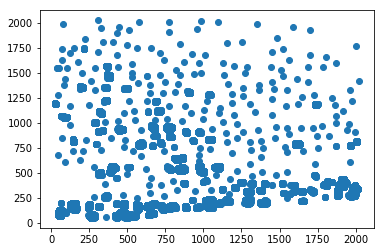

In [100]:
plt.scatter(peaks[:,1],peaks[:,0])

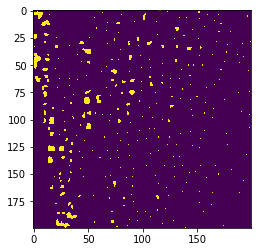

In [109]:
hist = np.histogram2d(peaks[:,1],peaks[:,0],bins=200)[0]
binary = hist>0
regions = regionprops(binary)
coord = 
for i in regions:
    coord.append
plt.imshow()

In [106]:
2048/50


40.96

In [ ]:
from scipy.spatial.distance import cdist
cdist = cdist()

In [26]:
peaks

array([[2032,  573,   51],
       [2019,  308,   39],
       [2016, 1787,   41],
       [2015, 1217,   48],
       [2003,  725,   49],
       [1989, 1420,   53],
       [1985,   80,   36],
       [1984,  213,   44],
       [1978,  910,   64],
       [1961, 1005,   49],
       [1955, 1602,   33],
       [1946,  351,   39],
       [1939,  780,   47],
       [1936,  652,   13],
       [1932, 1302,   40],
       [1920, 1743,   52],
       [1915,  831,   53],
       [1913, 1487,   56],
       [1870,  144,   51],
       [1869,  223,   57],
       [1841, 1023,   45],
       [1838,  316,   38],
       [1831,  568,   46],
       [1822,  649,   14],
       [1820, 1756,   48],
       [1817,  900,   53],
       [1805, 1250,   38],
       [1798,   67,   44],
       [1794, 1935,   52],
       [1793, 1149,   30],
       [1769,  402,   42],
       [1758, 1036,   62],
       [1746,  509,   45],
       [1733,  218,   53],
       [1723,  715,   39],
       [1690,  919,   26],
       [1686, 1465,   46],
 

In [28]:
import plotly 
import plotly.graph_objs as go

plotly.offline.init_notebook_mode(connected=True)
X = peaks[:,0]
Y = peaks[:,1]
Z = peaks[:,2]

# X = [a for b in X for a in b]
# Y = [a for b in Y for a in b]
# Z = [a for b in Z for a in b]
# C = [a for b in C for a in b]

plotly.offline.iplot({
    "data": [go.Scatter3d(x=X, y=Y, z=Z, mode='markers', marker=dict(size=2, opacity=0.5))]
})
#url=plotly.offline.iplot(fig, filename='your_filename')

In [ ]:
local_maxi

In [ ]:
from skimage.feature import peak_local_max
peaks = peak_local_max(stk[:,:,22],min_distance=50,)